In [1]:
import pandas as pd
import numpy
import numpy as np
from os.path import exists
from os import mkdir
from os import listdir
from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable
import matplotlib as mpl
import matplotlib
import matplotlib.pyplot as plt
#from matplotlib import pyplot as plt
from matplotlib.ticker import MaxNLocator
from matplotlib import cm
from mpl_toolkits import mplot3d
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import ListedColormap
from matplotlib.patches import FancyArrowPatch
from mpl_toolkits.axes_grid1.inset_locator import InsetPosition
import matplotlib.colors as cols
import matplotlib.gridspec as grid_spec
import scipy
import seaborn as sns
import re
import csv as csv
from itertools import cycle
from sklearn.neighbors import KernelDensity
import trimesh
import sys
from numpy.random import randn
from scipy import array, newaxis
from scipy.spatial import Delaunay
import proplot as pplt
import proplot as plot
from matplotlib.gridspec import GridSpec
from matplotlib.offsetbox import AnchoredText
import open3d as o3d
import os
import sys
import copy
import trimesh
import open3d as o3d
import scipy
from scipy import stats
from scipy.stats import mannwhitneyu, normaltest
from utils import *
# To illustrate examples
import numpy as np
from statannotations.Annotator import Annotator
from scipy import stats
from scipy.stats import mannwhitneyu, normaltest

#%env OPEN3D_CPU_RENDERING true

#install.packages("viridis")
#library(viridis)


mpl.rcParams["figure.dpi"] = 300
mpl.rcParams["legend.fontsize"] = 12
mpl.rcParams["font.size"] = 12

# import matplotlib.tri as mtri

# from scipy.interpolate import griddata

PLOTDIR = "plots"
DATADIR = "data"

DIRS = [PLOTDIR, DATADIR]

def plot_savepath(filename):
    return PLOTDIR + f"/{filename}"

def data_path(filename):
    return DATADIR + f"/{filename}"

for d in DIRS:
    if not exists(d):
        mkdir(d)
        
        
output_dir = f"figures/experiments/"
# Path(output_dir).mkdir(parents=True, exist_ok=True)


In [2]:
Organoid_Names = ['DMSO_#1_MAP2.xls',
                  'DMSO_#2_MAP2.xls', 
                  'DMSO_#3_MAP2.xls',
                  '5uM_#1_MAP2.xls', 
                  '5uM_#2_MAP2.xls',
                  '5uM_#3_MAP2.xls',
                  '1uM_#1_MAP2.xls', 
                  '1uM_#2_MAP2.xls',
                  '1uM_#3_MAP2.xls',]

organoid_pts = []

for name in Organoid_Names:
    df = pd.read_excel(data_path(name), header = None, skiprows =1)
    df = df.rename(columns = df.iloc[0]).drop(df.index[0])
    df_drop = df.drop(columns=['Unit', 'Category', 'Collection', 'Time', 'ID'])
    pts = df_drop.to_numpy()
    organoid_pts.append(pts)

In [3]:
Entity_Names = ['DMSO_#1_CFSE.xls',
                'DMSO_#2_CFSE.xls', 
                'DMSO_#3_CFSE.xls',
                '5uM_#1_CFSE.xls', 
                '5uM_#2_CFSE.xls',
                '5uM_#3_CFSE.xls',
                '1uM_#1_CFSE.xls', 
                '1uM_#2_CFSE.xls',
                '1uM_#3_CFSE.xls',]

entity_pts = []

for name in Entity_Names:
    df = pd.read_excel(data_path(name), header = None, skiprows =1)
    df = df.rename(columns = df.iloc[0]).drop(df.index[0])
    df_drop = df.drop(columns=['Unit', 'Category', 'Collection', 'Time', 'ID'])
    pts = df_drop.to_numpy()
    entity_pts.append(pts)

In [4]:
assert len(organoid_pts)==len(entity_pts)

distances = []

for index in range(len(organoid_pts)):
    # Organoids
    pcd_org = o3d.geometry.PointCloud()
    pcd_org.points = o3d.utility.Vector3dVector(organoid_pts[index])
    pcd_org.compute_convex_hull()
    pcd_org.estimate_normals()
    pcd_org.orient_normals_consistent_tangent_plane(10)
    
    with o3d.utility.VerbosityContextManager(
            o3d.utility.VerbosityLevel.Debug) as cm:
        mesh_org, densities = o3d.geometry.TriangleMesh.create_from_point_cloud_poisson(
            pcd_org, depth=10, scale=10, linear_fit=True)
    # print(mesh)
    mesh_org.paint_uniform_color([0.8, 0.2, 0])
    mesh_org.compute_vertex_normals()
    mesh_org.filter_smooth_simple(number_of_iterations=5)
    
    mesh_to_fill_org = o3d.t.geometry.TriangleMesh.from_legacy(mesh_org)
    mesh_to_fill_org.fill_holes(hole_size=10)
    final_mesh_org = mesh_to_fill_org.to_legacy()
    
    # Entities
    pcd_ent = o3d.geometry.PointCloud()
    pcd_ent.points = o3d.utility.Vector3dVector(entity_pts[index])
    pcd_ent.compute_convex_hull()
    pcd_ent.estimate_normals()
    pcd_ent.orient_normals_consistent_tangent_plane(10)
    
    with o3d.utility.VerbosityContextManager(
            o3d.utility.VerbosityLevel.Debug) as cm:
        mesh_ent, densities = o3d.geometry.TriangleMesh.create_from_point_cloud_poisson(
            pcd_ent, depth=10, scale=10, linear_fit=True)
    # print(mesh)
    mesh_ent.paint_uniform_color([0.8, 0.2, 0])
    mesh_ent.compute_vertex_normals()
    mesh_ent.filter_smooth_simple(number_of_iterations=5)
    
    mesh_to_fill_ent = o3d.t.geometry.TriangleMesh.from_legacy(mesh_ent)
    mesh_to_fill_ent.fill_holes(hole_size=10)
    final_mesh_ent = mesh_to_fill_ent.to_legacy()
    
    # Calculation of distances
    mesh_org_toleg = o3d.t.geometry.TriangleMesh.from_legacy(final_mesh_org)
    mesh_ent_toleg = o3d.t.geometry.TriangleMesh.from_legacy(final_mesh_ent)
    
    scene = o3d.t.geometry.RaycastingScene()
    mesh_ids = {}
    mesh_ids[scene.add_triangles(mesh_org_toleg)] = 'surface'
    mesh_ids[scene.add_triangles(mesh_ent_toleg)] = 'cells'

    query_point = np.asarray(entity_pts[index]).astype('float32')

    unsigned_distance = scene.compute_distance(query_point)
    distances.append(unsigned_distance.numpy())

[Open3D DEBUG] Input Points / Samples: 29174 / 15723
[Open3D DEBUG] #   Got kernel density: 0.00246692 (s), 366.051 (MB) / 366.051 (MB) / 366 (MB)
[Open3D DEBUG] #     Got normal field: 0.0320439 (s), 368.176 (MB) / 368.176 (MB) / 368 (MB)
[Open3D DEBUG] Point weight / Estimated Area: 8.252692e-07 / 2.407640e-02
[Open3D DEBUG] #       Finalized tree: 0.0364249 (s), 373.484 (MB) / 373.484 (MB) / 373 (MB)
[Open3D DEBUG] #  Set FEM constraints: 0.0411961 (s), 375.078 (MB) / 375.078 (MB) / 375 (MB)
[Open3D DEBUG] #Set point constraints: 0.00439501 (s), 375.102 (MB) / 375.102 (MB) / 375 (MB)
[Open3D DEBUG] Leaf Nodes / Active Nodes / Ghost Nodes: 186621 / 213272 / 9
[Open3D DEBUG] Memory Usage: 375.102 MB
[Open3D DEBUG] # Linear system solved: 0.135824 (s), 381.605 (MB) / 381.605 (MB) / 381 (MB)
[Open3D DEBUG] Got average: 0.00473118 (s), 382.012 (MB) / 382.012 (MB) / 382 (MB)
[Open3D DEBUG] Iso-Value: 5.107694e-01 = 1.490119e+04 / 2.917400e+04
[Open3D DEBUG] #          Total Solve:       1

[Open3D DEBUG] # Linear system solved: 0.190449 (s), 461.918 (MB) / 461.918 (MB) / 461 (MB)
[Open3D DEBUG] Got average: 0.00398707 (s), 462.227 (MB) / 462.227 (MB) / 462 (MB)
[Open3D DEBUG] Iso-Value: 5.090387e-01 = 1.052234e+04 / 2.067100e+04
[Open3D DEBUG] #          Total Solve:       1.4 (s),     479.2 (MB)
[Open3D WARNING] Ignoring attribute 'normals' for TensorMap with primary key 'indices'
[Open3D DEBUG] Input Points / Samples: 4857 / 4483
[Open3D DEBUG] #   Got kernel density: 0.00181007 (s), 482.254 (MB) / 482.254 (MB) / 482 (MB)
[Open3D DEBUG] #     Got normal field: 0.0147271 (s), 482.254 (MB) / 482.254 (MB) / 482 (MB)
[Open3D DEBUG] Point weight / Estimated Area: 4.741791e-06 / 2.303088e-02
[Open3D DEBUG] #       Finalized tree: 0.0248342 (s), 482.789 (MB) / 482.789 (MB) / 482 (MB)
[Open3D DEBUG] #  Set FEM constraints: 0.0382192 (s), 482.797 (MB) / 482.797 (MB) / 482 (MB)
[Open3D DEBUG] #Set point constraints: 0.00323987 (s), 482.797 (MB) / 482.797 (MB) / 482 (MB)
[Open3D 

Cycle[0] Depth[ 5/10]:	Updated constraints / Got system / Solved in:  0.001 /  0.011 /  0.010	(461.191 [Open3D DEBUG] # Linear system solved: 0.183138 (s), 443.203 (MB) / 538.066 (MB) / 539 (MB)MB)	Nodes: 35937
          GS: 2.5442e-01 -> 2.5442e-01 -> 2.5092e-03 (9.9e-03) [8]
Cycle[0] Depth[ 6/10]:	Updated constraints / Got system / Solved in:  0.001 /  0.001 /  0.001	(461.191 MB)	Nodes: 2920
            GS: 2.3844e-01 -> 2.3844e-01 -> 1.3434e-03 (5.6e-03) [8]
Cycle[0] Depth[ 7/10]:	Updated constraints / Got system / Solved in:  0.002 /  0.001 /  0.002	(461.203 MB)	Nodes: 5832
              GS: 2.5001e-01 -> 2.5001e-01 -> 1.3436e-03 (5.4e-03) [8]
Cycle[0] Depth[ 8/10]:	Updated constraints / Got system / Solved in:  0.002 /  0.003 /  0.006	(461.395 MB)	Nodes: 15280
                GS: 2.0829e-01 -> 2.0829e-01 -> 9.2782e-04 (4.5e-03) [8]
Cycle[0] Depth[ 9/10]:	Updated constraints / Got system / Solved in:  0.003 /  0.008 /  0.015	(461.395 MB)	Nodes: 46344
                  GS: 1.4829e-0

[Open3D DEBUG] #     Got normal field: 0.032176 (s), 447.77 (MB) / 538.066 (MB) / 539 (MB) -> 1.8710e-01 -> 4.1251e-03 (2.2e-02) [8]
Cycle[0] Depth[ 4/10]:	Updated constraints / Got system / Solved in:  0.001 /  0.003 /  0.001	(434.551 MB)	Nodes: 4913
        GS: 2.3743e-01 -> 2.3743e-01 -> 4.2188e-03 (1.8e-02) [8]
Cycle[0] Depth[ 5/10]:	Updated constraints / Got system / Solved in:  0.001 /  0.013 /  0.017	(434.551 MB)	Nodes: 35937
          GS: 2.4672e-01 -> 2.4672e-01 -> 2.4694e-03 (1.0e-02) [8]
Cycle[0] Depth[ 6/10]:	Updated constraints / Got system / Solved in:  0.001 /  0.001 /  0.002	(434.551 MB)	Nodes: 2952
            GS: 2.0829e-01 -> 2.0829e-01 -> 9.3696e-04 (4.5e-03) [8]
Cycle[0] Depth[ 7/10]:	Updated constraints / Got system / Solved in:  0.002 /  0.002 /  0.002	(434.551 MB)	Nodes: 5440
              GS: 2.0503e-01 -> 2.0503e-01 -> 7.6338e-04 (3.7e-03) [8]
Cycle[0] Depth[ 8/10]:	Updated constraints / Got system / Solved in:  0.002 /  0.002 /  0.006	(434.551 MB)	Nodes: 1421

In [5]:
dict_keys = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I']

d = dict(zip(dict_keys, distances))

In [6]:
df = pd.DataFrame(dict([ (k,pd.Series(v)) for k,v in d.items() ]))
df = df.melt(var_name = "Entity", value_name = "Distance to Surface (\u03BCm)")
df

,Entity,Distance to Surface (μm)
0,A,1.693893
1,A,1.876806
2,A,0.593820
3,A,0.402762
4,A,1.217044
...,...,...
77350,I,NaN
77351,I,NaN
77352,I,NaN
77353,I,NaN


In [7]:
df.loc[df['Entity'] == 'A', 'Types'] = 'Repeat 1'  
df.loc[df['Entity'] == 'B', 'Types'] = 'Repeat 2'  
df.loc[df['Entity'] == 'C', 'Types'] = 'Repeat 3'  
df.loc[df['Entity'] == 'D', 'Types'] = 'Repeat 1'  
df.loc[df['Entity'] == 'E', 'Types'] = 'Repeat 2'  
df.loc[df['Entity'] == 'F', 'Types'] = 'Repeat 3'
df.loc[df['Entity'] == 'G', 'Types'] = 'Repeat 1'  
df.loc[df['Entity'] == 'H', 'Types'] = 'Repeat 2'  
df.loc[df['Entity'] == 'I', 'Types'] = 'Repeat 3'

#df_depth_analysis['Location'] = ['below-surface' if x >= 10 else 'near-surface' for x in df_depth_analysis["Distance to Surface (\u03BCm)"]]

In [8]:
df['Entity'] = df['Entity'].replace({'A':'DMSO',
              'B':'DMSO',
              'C':'DMSO',
              'D':'5\u03BCM',
              'E':'5\u03BCM',
              'F':'5\u03BCM',
              'G':'1\u03BCM',
              'H':'1\u03BCM',
              'I':'1\u03BCM'}) 

In [9]:
df[np.isfinite(df["Distance to Surface (\u03BCm)"])]
df_final = df[df["Distance to Surface (\u03BCm)"] > 0.0001]

In [10]:
df_final

,Entity,Distance to Surface (μm),Types
0,DMSO,1.693893,Repeat 1
1,DMSO,1.876806,Repeat 1
2,DMSO,0.593820,Repeat 1
3,DMSO,0.402762,Repeat 1
4,DMSO,1.217044,Repeat 1
...,...,...,...
74815,1μM,3.654580,Repeat 3
74816,1μM,0.628659,Repeat 3
74817,1μM,2.156214,Repeat 3
74818,1μM,3.834267,Repeat 3


In [11]:
#leukemia data
df.rename(columns={'A': 'DMSO',
                   'B': 'DMSO',
                   'C': 'DMSO',
                   'D': '5\u03BCM',
                   'E': '5\u03BCM',
                   'F': '5\u03BCM',
                   'G': '1\u03BCM',
                   'H': '1\u03BCM',
                   'I': '1\u03BCM'}, inplace=True)

#df.to_excel("unmelted_leukemia_data.xlsx", sheet_name='unmeltedLEUK') 
df_leukemia = df.melt(var_name = "Entity", value_name = "Distance to Surface (\u03BCm)")
#df_leukemia.to_excel("melted_leukemia_data.xlsx", sheet_name='meltedLEUK') 
#df_leukemia['Location'] = ['below-surface' if x >= 20 else 'near-surface' for x in df_leukemia["Distance to Surface (\u03BCm)"]]
df_adjusted = df[df["Distance to Surface (\u03BCm)"] >= 20]
#df_adjusted.to_excel("adjusted distance leuk vs healthy.xlsx", sheet_name='adjusted length') 

/var/folders/9w/4xkqf_xd0kg5ycr900ldx_9w0000gn/T/ipykernel_8561/1260714176.py:13: FutureWarning: This dataframe has a column name that matches the 'value_name' column name of the resulting Dataframe. In the future this will raise an error, please set the 'value_name' parameter of DataFrame.melt to a unique name.
  df_leukemia = df.melt(var_name = "Entity", value_name = "Distance to Surface (\u03BCm)")


In [12]:
sns.set_theme(style="ticks", palette="pastel")
fig, axes = plt.subplots(1, 2, figsize=(25, 10), gridspec_kw={'width_ratios': [1, 2]})
g = sns.stripplot(ax=axes[0], data=df_final,
              x="Entity", y="Distance to Surface (\u03BCm)",
              hue="Types", palette="magma", linewidth=0.5,
              size=2.5, alpha=0.6, jitter=.30, dodge=True,
                 )
    
g.set_yscale("log")
# the non-logarithmic labels you want
ticks = [0.01, 0.1, 1, 10, 100, 1000]
g.set_yticks(ticks)
g.set_yticklabels(ticks)

g.tick_params(axis='x', rotation=45)
g.xaxis.label.set_visible(False)

sns.move_legend(
    g, loc="best", ncol=1, frameon=False, columnspacing=5, handletextpad=0
)

g.axhline(10, color='r')

g = sns.histplot(
    df_final,
    x="Distance to Surface (\u03BCm)", hue="Entity",
    bins=200,
    multiple="stack",
    palette="magma",
    element="bars",
    edgecolor=".3",
    common_norm=False,
    kde=False,
    pmax=1000,
    linewidth=.2,
    stat="count",
    log_scale=True,
)

sns.move_legend(
    g, loc="best", ncol=1, frameon=False, columnspacing=5, handletextpad=0)

# the non-logarithmic labels you want
axes[0].grid(color='black', alpha=0.5, linestyle='dashed', linewidth=0.5)
axes[0].set_xlabel('Entity', fontweight ='bold')
axes[0].set_ylabel('Distance to Surface (\u03BCm)', fontweight ='bold')
ticks = [10, 20, 30, 40, 50, 60, 70, 80, 90, 100]
g.set_yticks(ticks)
g.set_yticklabels(ticks)

axes[1].grid(color='black', alpha=0.5, linestyle='dashed', linewidth=0.5)
axes[1].set_xlabel('Distance to Surface (\u03BCm)', fontweight ='bold')
axes[1].set_ylabel('Count', fontweight ='bold')
ticks = [100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 1100, 1200, 1300, 1400, 1500]
g.set_yticks(ticks)
g.set_yticklabels(ticks)

g.axvline(x=10, color='r')

#axes[1].set_title("Violinplot", fontsize=20)

#g = ax=axes[2].imshow(img_org)
#axes[2].set_xlabel('Position X (\u03BCm)', fontweight ='bold')
#axes[2].set_ylabel('Position Y (\u03BCm)', fontweight ='bold')

#g = ax=axes[3].imshow(img_ent)
#axes[3].set_xlabel('Position X (\u03BCm)', fontweight ='bold')
#axes[3].set_ylabel('Position Y (\u03BCm)', fontweight ='bold')


texts = ['C', 'D']
ax = fig.get_axes()
for a,l in zip(ax, texts):
    a.annotate(l, xy=(-0.1, 1.1), xycoords="axes fraction", fontsize=45, weight = 'bold')
#plt.suptitle('Label_Distance Consistent', fontsize = 20)
plt.savefig(plot_savepath('T5224.pdf'), bbox_inches='tight')
plt.savefig(plot_savepath('T5224.png'), dpi=300, bbox_inches='tight')

In [13]:
#vis = o3d.visualization.Visualizer()
#vis.create_window(visible=False) #works for me with False, on some systems needs to be true
#vis.add_geometry(final_mesh_org)
#vis.update_geometry(final_mesh_org)
#vis.poll_events()
#vis.update_renderer()
#vis.capture_screen_image(plot_savepath('1857.png'), do_render=True)
#vis.destroy_window()

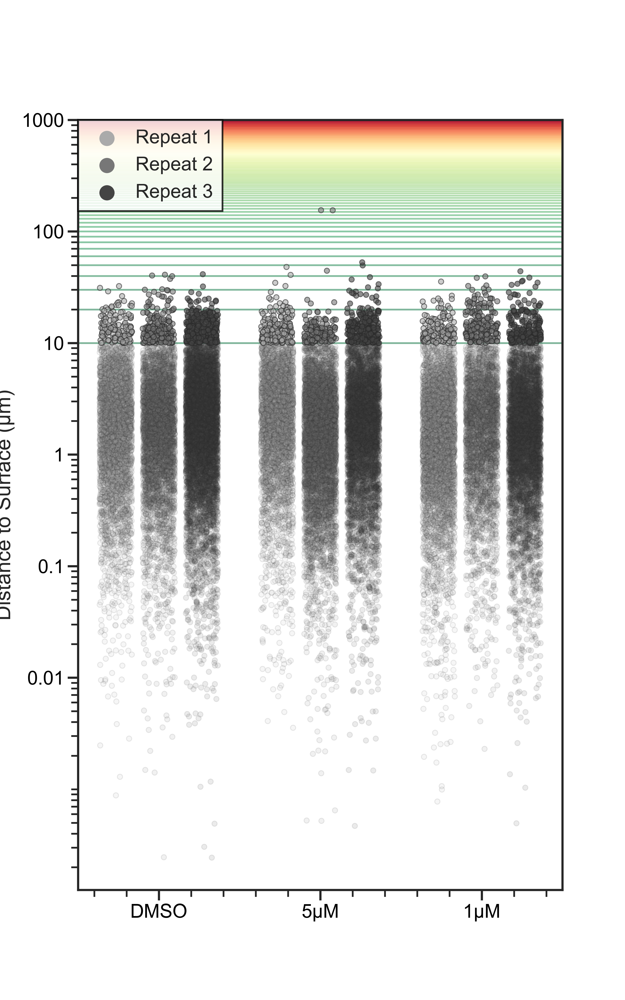

In [27]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the theme for the plots
sns.set_theme(style="ticks", palette="gray")

# Create a figure and axis for the plot
fig, ax = plt.subplots(figsize=(5, 8))

# Define a grayscale palette for triplicates
grayscale_palette = ["#AAAAAA", "#777777", "#444444"]

# Get unique entities and group them as required
unique_entities = df_final['Entity'].unique()
# Grouping the entities. Adjust the slicing as per your specific groups.
groups = [unique_entities[0:6]]  # Following four entities

# Iterate through each group and plot in the same axis
for i, group in enumerate(groups):
    # Filter the DataFrame for the current group
    filtered_data = df_final[df_final['Entity'].isin(group)]

    # Separate the data based on the value of 10
    below_10 = filtered_data[filtered_data["Distance to Surface (\u03BCm)"] <= 10]
    above_10 = filtered_data[filtered_data["Distance to Surface (\u03BCm)"] > 10]

    # Create a stripplot for data below 10 with grayscale palette
    sns.stripplot(ax=ax, data=below_10,
                  x="Entity", y="Distance to Surface (\u03BCm)",
                  hue="Types", palette=grayscale_palette, linewidth=0.5,
                  size=3, alpha=0.1, jitter=.30, dodge=True)

    # Create a stripplot for data above 10 with grayscale palette
    sns.stripplot(ax=ax, data=above_10,
                  x="Entity", y="Distance to Surface (\u03BCm)",
                  hue="Types", palette=grayscale_palette, linewidth=0.5,
                  size=3, alpha=0.6, jitter=.30, dodge=True)

    # Set y-scale to logarithmic and apply fixed ticks
    ax.set_yscale("log")
    ticks = [0.01, 0.1, 1, 10, 100, 1000]
    ax.set_yticks(ticks)
    ax.set_yticklabels(ticks)

    # Draw wider colored horizontal bars to fill the background
    for y in range(10, 1000, 10):
        ax.axhline(y=y, color=plt.cm.RdYlGn(1 - y / 1000), linewidth=1, alpha=0.5)  # Switch green and red and increase linewidth

    # Remove the 'Entity' label from the x-axis
    ax.set_xlabel('')

    # Additional customization (can be adjusted as needed)
    # ...

# Add annotations if needed...
#texts = ['A', 'B', 'C']
#for t, x in zip(texts, [0.1, 0.5, 0.9]):
#    ax.annotate(t, xy=(x, 1.03), xycoords="axes fraction", fontsize=15, weight='bold')

# Adjust the legend to only show items from the 'above_10' plot
handles, labels = ax.get_legend_handles_labels()
unique_labels = []
unique_handles = []
for handle, label in zip(handles, labels):
    if label not in unique_labels:
        unique_labels.append(label)
        unique_handles.append(handle)
ax.legend(unique_handles, unique_labels, loc='upper left')

# Save and show the plot
# Replace 'plot_savepath' with your actual function or path
plt.savefig(plot_savepath('T5224.pdf'), bbox_inches='tight')
plt.savefig(plot_savepath('T5224.png'), dpi=300, bbox_inches='tight')

plt.show()